In [1]:
from pde import *
import math
import matplotlib.pyplot as plt

In [1]:
from pde import CartesianGrid, VectorField

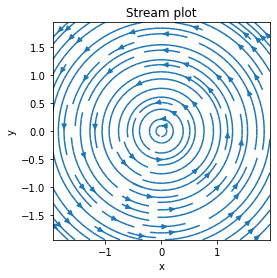

In [2]:
grid = CartesianGrid([[-2, 2], [-2, 2]], 32)
field = VectorField.from_expression(grid, ["-y", "x"])
field.plot(method="streamplot", title="Stream plot")

In [4]:
from math import sqrt

#from pde import PDE, CartesianGrid, MemoryStorage, ScalarField, plot_kymograph

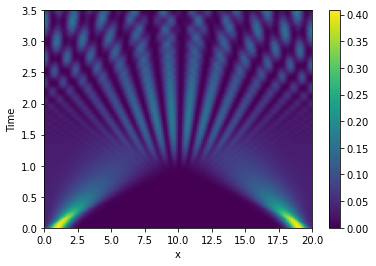

In [5]:
grid = CartesianGrid([[0, 20]], 128, periodic=False)  # generate grid

# create a (normalized) wave packet with a certain form as an initial condition
initial_state = ScalarField.from_expression(grid, "exp(-I * 2 * x) * exp(-(x - 19)**2)")
initial_state+= ScalarField.from_expression(grid, "exp(I * 2 * x) * exp(-(x - 1)**2)")
initial_state /= sqrt(initial_state.to_scalar("norm_squared").integral.real)

eq = PDE({"ψ": f"I * laplace(ψ)"})  # define the pde, i dP/dt = -d^2/dx^2 P <=> dP/dt = i d^2/dx^2 P

# solve the pde and store intermediate data
storage = MemoryStorage()
eq.solve(initial_state, t_range=3.5, dt=1e-5, tracker=[storage.tracker(0.02)])

# visualize the results as a space-time plot
plot_kymograph(storage, scalar="norm_squared")

  0%|          | 0/30.0 [00:00<?, ?it/s]

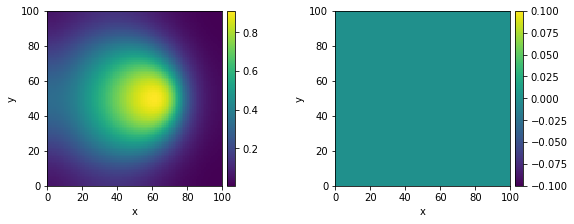

In [21]:
class NavSto2d(PDEBase):
    """2D Navier-Stokes for incompressible fluids"""
    def __init__(self,grid,murho=.8,rho=0.4,Px=0,Py=0,Gx=0,Gy=0,bc="auto_periodic_neumann"):
        self.bc=bc
        self.murho=murho
        self.rho=rho
        self.Px=ScalarField.from_expression(grid, "0")
        self.Py=ScalarField.from_expression(grid, "0")
        self.Gx=ScalarField.from_expression(grid, "0")
        self.Gy=ScalarField.from_expression(grid, "0")
    def evolution_rate(self, state, t=0):
        U,V=state
        dUdx=U.gradient(self.bc)[0]
        dUdy=U.gradient(self.bc)[1]
        dVdx=V.gradient(self.bc)[0]
        dVdy=V.gradient(self.bc)[1]
        U_t=-U * dUdx - V * dUdy + self.murho*U.laplace(self.bc) - self.Px/self.rho + self.Gx
        V_t=-U * dVdx + V * dUdx + self.murho*V.laplace(self.bc) - self.Py/self.rho + self.Gy
        return FieldCollection([U_t, V_t])

grid = UnitGrid([100, 100])
#state = FieldCollection.scalar_random_uniform(2, grid)
#state = FieldCollection.from_scalar_expressions(grid, ["exp((-(x-45)**2-(y-50)**2)*0.001)+exp((-(x-55)**2-(y-50)**2)*0.001)","0"])
state = FieldCollection.from_scalar_expressions(grid, ["exp((-(x-35)**2-(y-50)**2)*0.001)","0"])

eq = NavSto2d(grid)
storage = MemoryStorage()
result = eq.solve(state, t_range=30, dt=0.01, tracker=["progress", storage.tracker(1)])
result.plot()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


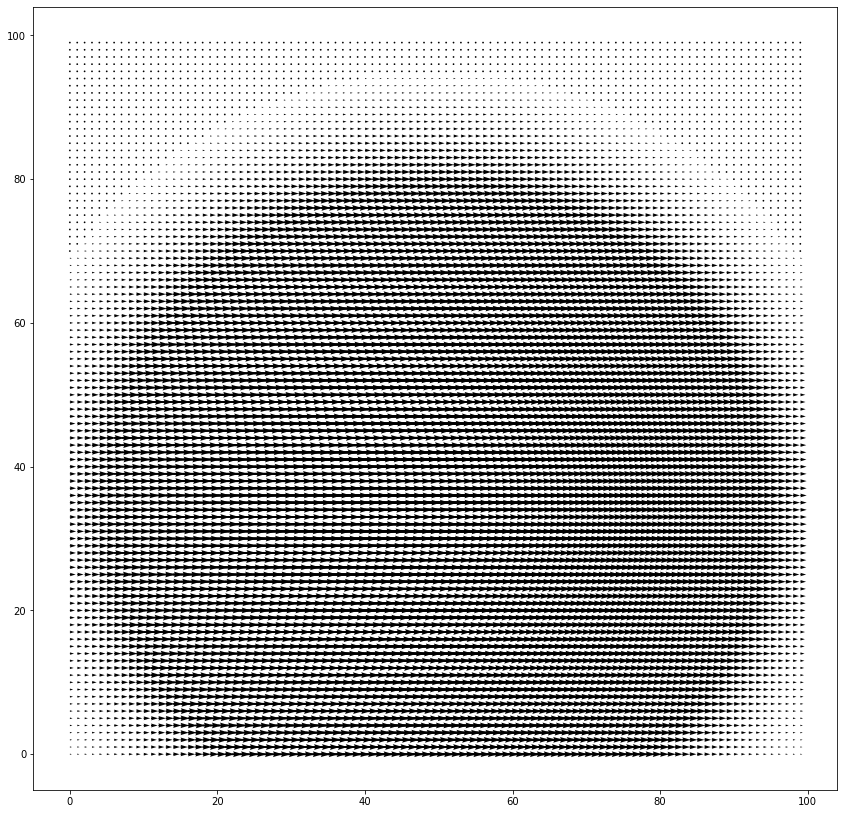

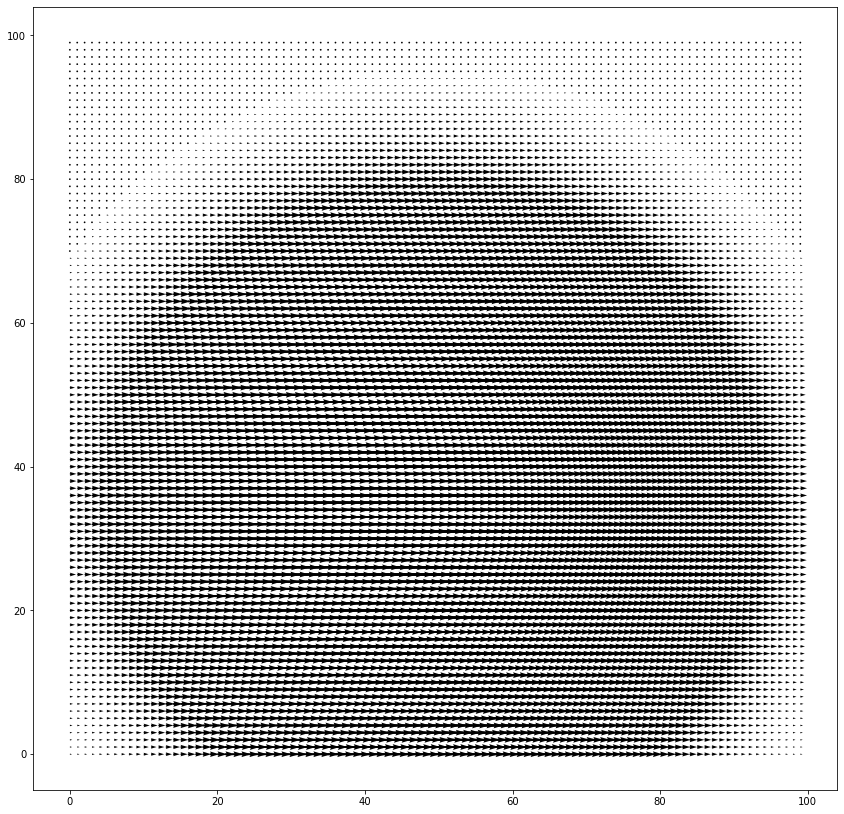

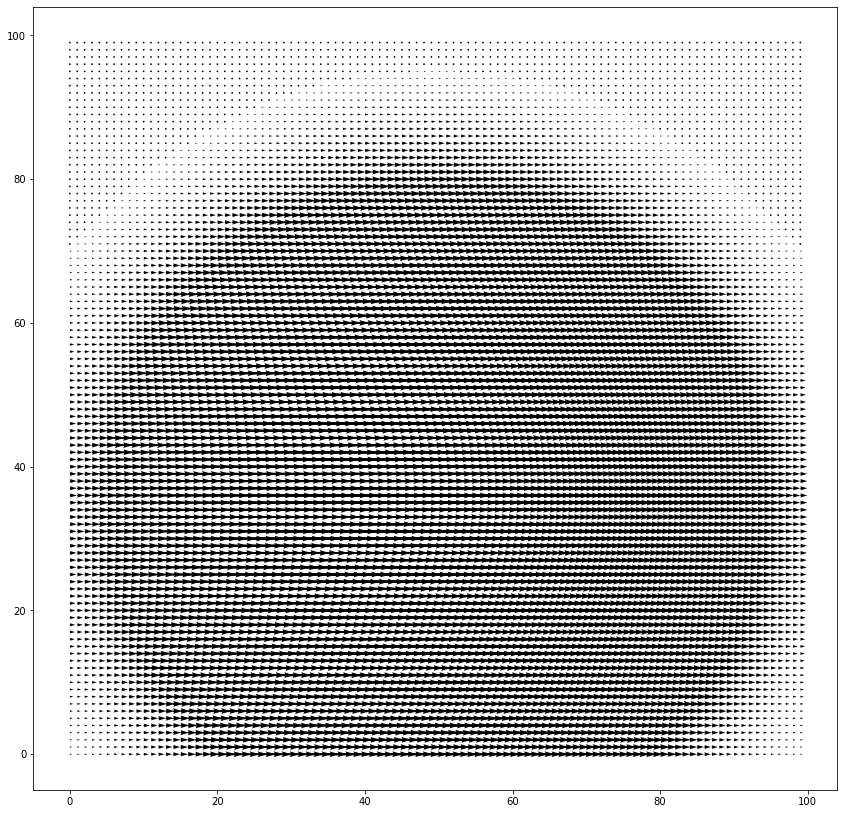

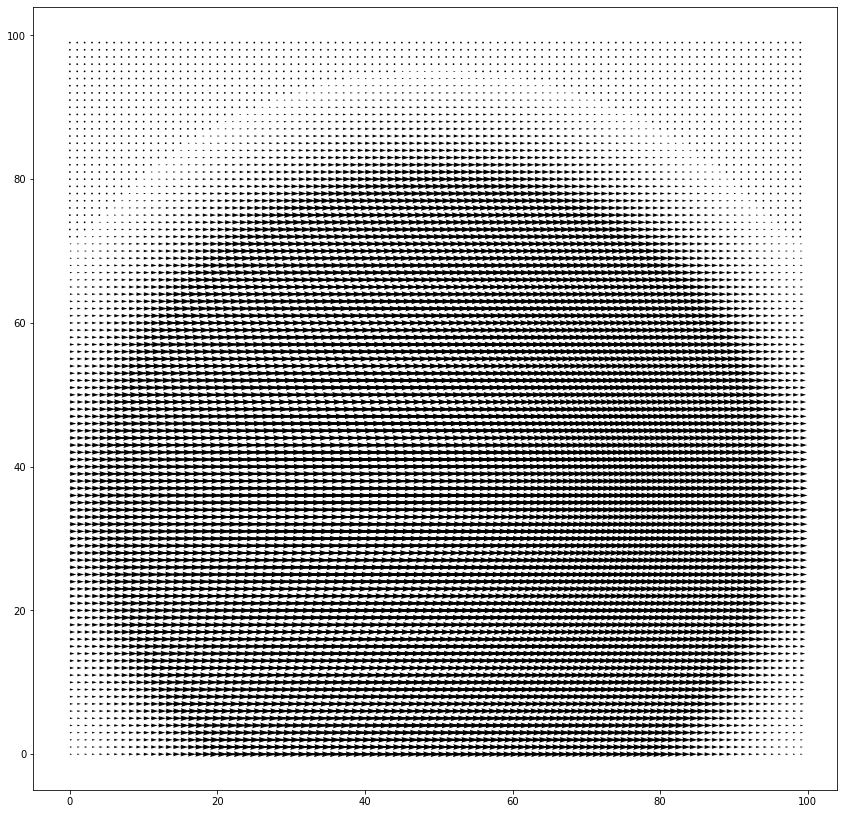

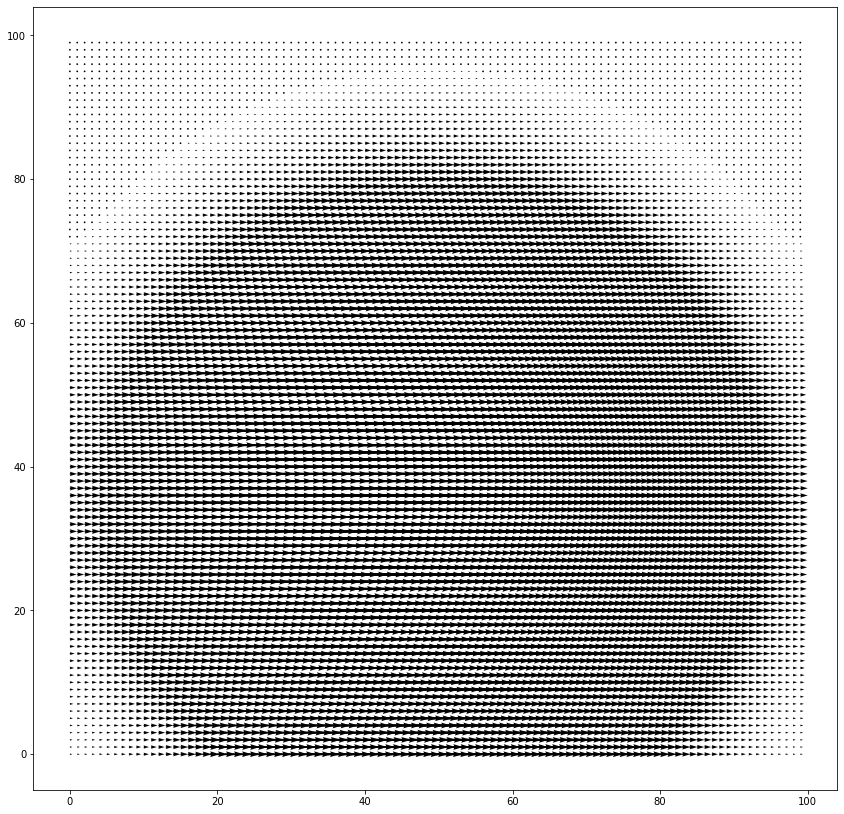

...

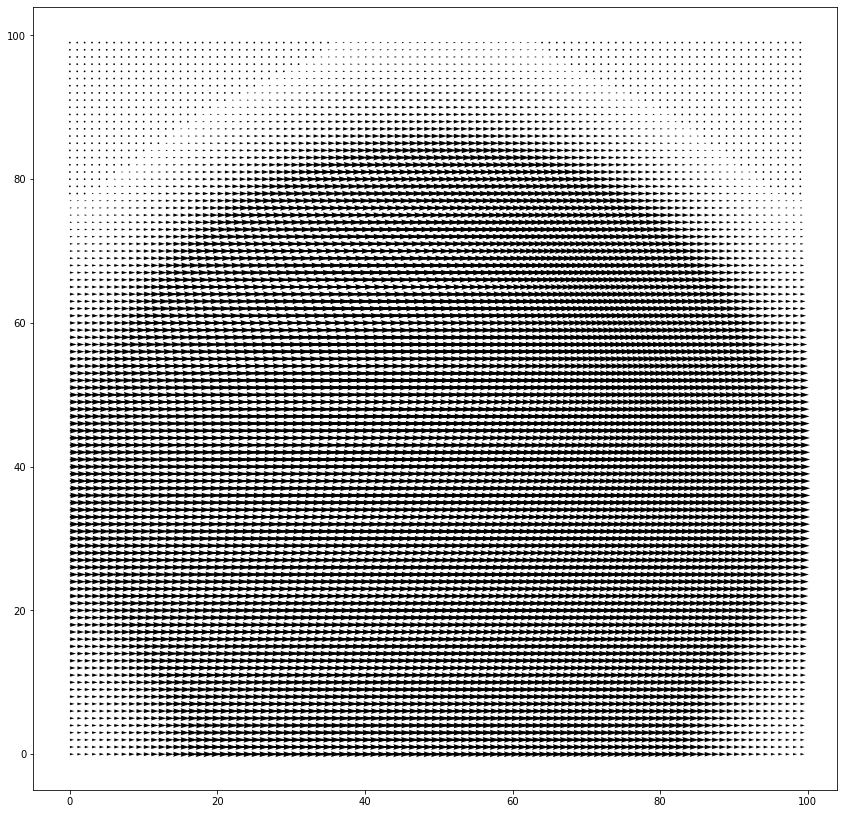

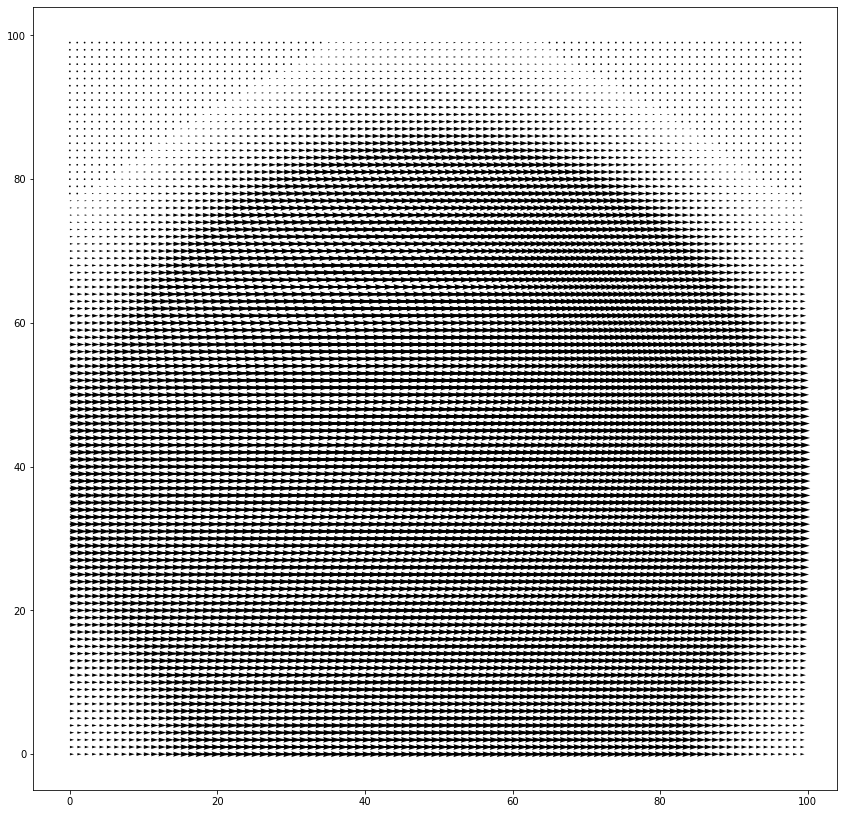

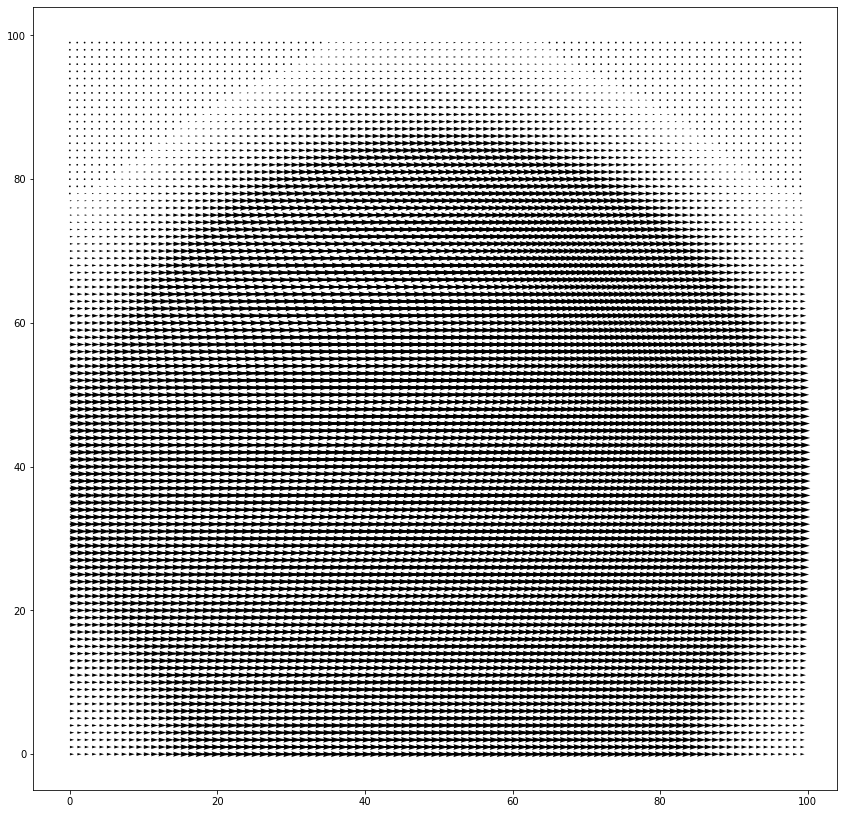

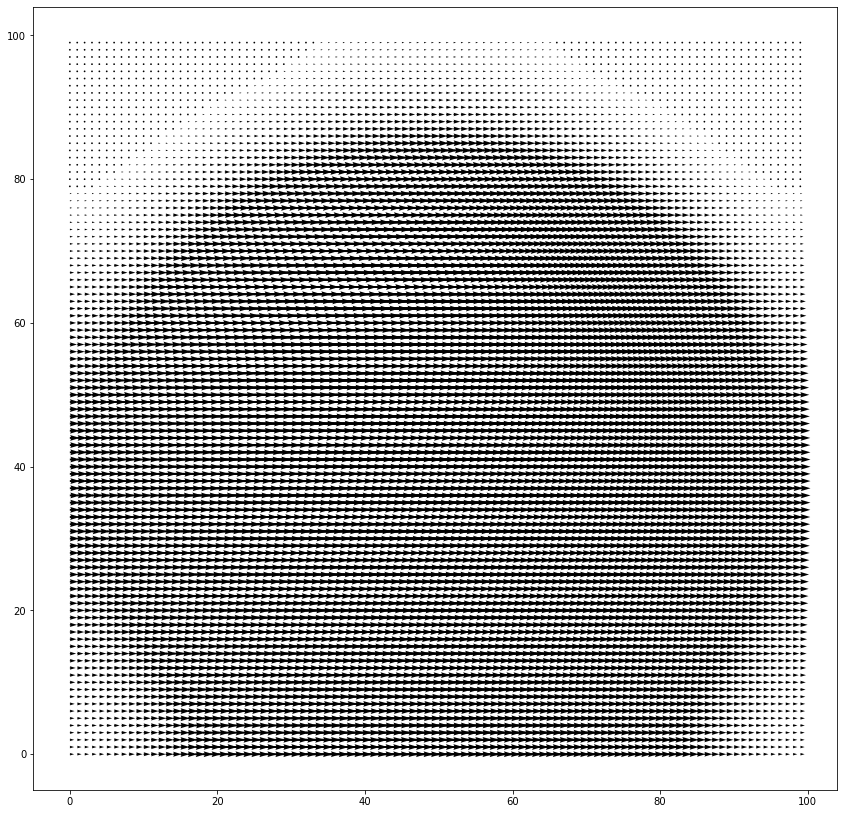

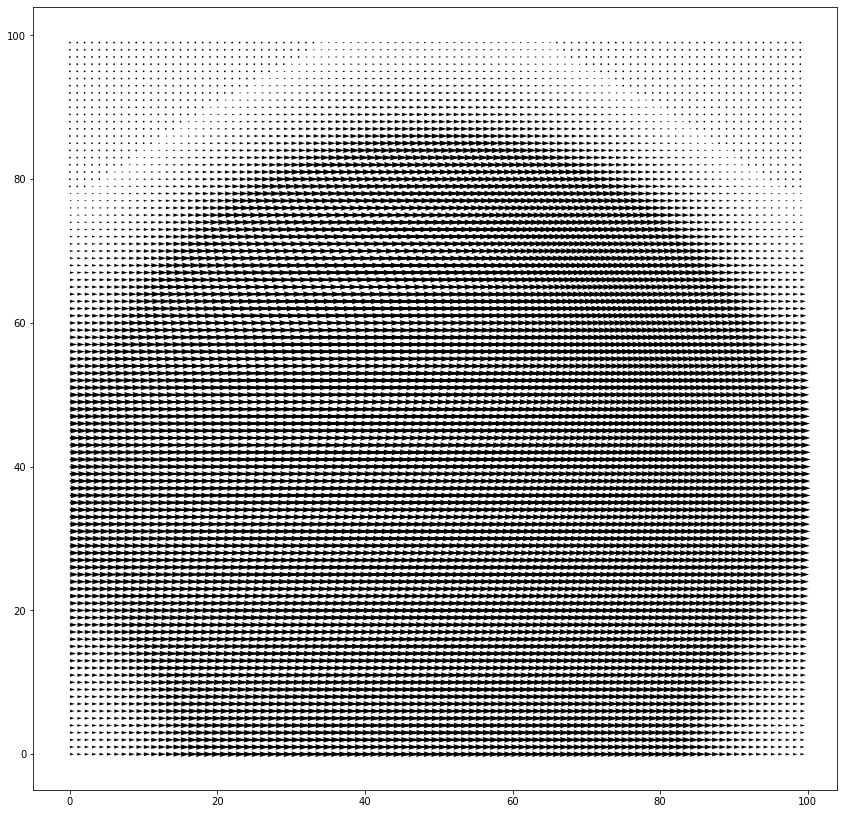

In [23]:
#nsfield=VectorField([6,6])
#FieldCollection.scalar_random_uniform(2, grid)[0].plot()
#FieldCollection.from_scalar_expressions(grid, ["exp(-(x-3)**2-(y-3)**2)","cos(x)*0"]).plot()

#result = eq.solve(state, t_range=100, dt=0.01, tracker=["progress", storage.tracker(1)])
#state.plot()
#nsvf=VectorField.from_scalars([result[0],result[1]]).plot()
for fr in storage.data:
    #print(fr[0].size)
    #VectorField(UnitGrid([12, 12]),[fr[0],fr[1]]).plot()
    pa,pb=plt.subplots(1,1,figsize=(3*4.8,3*4.8))
    pb.quiver(fr[0],fr[1],scale_units="xy",scale=.1)
#mymov=visualization.movies.Movie("./nav.mp4",10,2.5)
#mymov.add_figure(nsvf)
#mymov.save()
#movie(storage, filename="./nav.mp4")
#save()